In [1]:
import traceback

import imlib as im
import numpy as np
import pylib as py
import tensorflow as tf
import tflib as tl
import tfprob
import tqdm

import data
import module


# ==============================================================================
# =                                   param                                    =
# ==============================================================================


py.arg('--att_len', type=int, default=13)

py.arg('--task', type=str, default='edges2shoes',  help='Task name')


py.arg('--load_size', type=int, default=143)
py.arg('--crop_size', type=int, default=128)
py.arg('--model', default='model_128', choices=['model_128', 'model_256', 'model_384'])

py.arg('--n_epochs', type=int, default=60)
py.arg('--epoch_start_decay', type=int, default=30)
py.arg('--batch_size', type=int, default=32)
py.arg('--learning_rate', type=float, default=2e-4)
py.arg('--beta_1', type=float, default=0.5)



py.arg('--n_d', type=int, default=5)  # # d updates per g update
py.arg('--adversarial_loss_mode', choices=['gan', 'hinge_v1', 'hinge_v2', 'lsgan', 'wgan'], default='wgan')
py.arg('--gradient_penalty_mode', choices=['none', '1-gp', '0-gp', 'lp'], default='1-gp')
py.arg('--gradient_penalty_sample_mode', choices=['line', 'real', 'fake', 'dragan'], default='line')

py.arg('--d_gradient_penalty_weight', type=float, default=10.0)
py.arg('--d_attribute_loss_weight', type=float, default=1.0)
py.arg('--g_attribute_loss_weight', type=float, default=10.0)
py.arg('--g_reconstruction_loss_weight', type=float, default=100.0)
py.arg('--weight_decay', type=float, default=0.0)

py.arg('--n_samples', type=int, default=12)
py.arg('--test_int', type=float, default=2.0)

py.arg('--experiment_name', default='default')




The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



_StoreAction(option_strings=['--experiment_name'], dest='experiment_name', nargs=None, const=None, default='default', type=None, choices=None, help=None, metavar=None)

In [2]:
args = py.args(["--experiment_name","AttGAN_128_0524_shoes_resize","--task","edges2shoes","--n_epochs","160"])



In [3]:
%%writefile download_pix2pix_dataset.sh 
FILE=$1

if [[ $FILE != "cityscapes" && $FILE != "edges2handbags" && $FILE != "edges2shoes" &&  $FILE != "facades" && $FILE != "maps" ]]; then
    echo "Available datasets are: edges2handbags, edges2shoes, maps, cityscapes, facades"
    exit 1
fi

URL=https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/$FILE.tar.gz
TAR_FILE=./datasets/$FILE.tar.gz
TARGET_DIR=./datasets/$FILE/
wget -N $URL -O $TAR_FILE
mkdir $TARGET_DIR
tar -zxvf $TAR_FILE -C ./datasets/
rm $TAR_FILE

Overwriting download_pix2pix_dataset.sh


In [4]:
#from https://github.com/clvrai/BicycleGAN-Tensorflow

datasets = ['maps', 'cityscapes', 'facades', 'edges2handbags', 'edges2shoes']

import os
from glob import glob

import numpy as np
from tqdm import tqdm


def download_dataset(task_name):
    print('Download data %s' % task_name)
    os.system('sh download_pix2pix_dataset.sh ' +  args.task)

def get_data(task_name):
    assert task_name in datasets, 'Dataset {} is not available'.format( task_name)

    if not os.path.exists('datasets'):
        os.makedirs('datasets')

    base_dir = os.path.join('datasets', task_name)
    print('Check data %s' % base_dir)
    if not os.path.exists(base_dir):
        print('Dataset not found. Start downloading...')
        download_dataset(task_name)


get_data(args.task)


Check data datasets/edges2shoes


In [5]:
import numpy as np
import pylib as py
import tensorflow as tf
import tflib as tl
from imlib import dtype



def make_dataset(img_dir,
                 batch_size=32,
                 load_size=286,
                 crop_size=256,
                 n_channels=3,
                 training=True,
                 drop_remainder=True,
                 shuffle=True,
                 repeat=None,
                 flip=False):


    img_paths = sorted(py.glob(img_dir, '*'))

    if shuffle:
        img_paths = np.random.permutation(img_paths)


    def _map_fn(img):
        if n_channels == 1:
            img = tf.image.rgb_to_grayscale(img)
        if flip:
            img=tf.image.flip_left_right(img)
        img=tf.cast(img, tf.float32)

        
        img = tf.clip_by_value(img, 0, 255) / 127.5 - 1

        return img

    dataset = tl.disk_image_batch_dataset(img_paths,
                                          batch_size,
                                          drop_remainder=drop_remainder,
                                          map_fn=_map_fn,
                                          shuffle=shuffle,
                                          repeat=repeat)

    
    
    if drop_remainder:
        len_dataset = len(img_paths) // batch_size
    else:
        len_dataset = int(np.ceil(len(img_paths) / batch_size))

    return dataset, len_dataset













In [6]:
import numpy as np
from pdb import set_trace
from tqdm.auto import tqdm, trange

# output_dir
output_dir = py.join('output', args.experiment_name)
py.mkdir(output_dir)



# save settings
py.args_to_yaml(py.join(output_dir, 'settings.yml'), args)

# others
n_atts = args.att_len

sess = tl.session()
sess.__enter__()  # make default

# ==============================================================================
# =                               data and model                               =
# ==============================================================================

# data
train_dir = py.join(py.join("datasets", args.task),"train") 
val_dir =py.join(py.join("datasets", args.task),"val") 

train_dataset, len_train_dataset =make_dataset(train_dir,args.batch_size,load_size=args.load_size, crop_size=args.crop_size)
val_dataset, len_val_dataset =make_dataset(val_dir,args.batch_size,load_size=args.load_size, crop_size=args.crop_size)



train_iter = train_dataset.make_one_shot_iterator()
val_iter = val_dataset.make_one_shot_iterator()

# model
Genc, Gdec, D = module.get_model(args.model, n_atts, weight_decay=args.weight_decay)

# loss functions
d_loss_fn, g_loss_fn = tfprob.get_adversarial_losses_fn(args.adversarial_loss_mode)


# ==============================================================================
# =                                   graph                                    =
# ==============================================================================

def D_train_graph():
    # ======================================
    # =               graph                =
    # ======================================

    # placeholders & inputs
    lr = tf.placeholder(dtype=tf.float32, shape=[])

    
    xa = train_iter.get_next()
    b_ = tf.random.normal([args.batch_size, n_atts])



    image_a,image_b=tf.split(xa,2,2)
    image_a = tf.image.resize_images(image_a, [args.crop_size, args.crop_size])
    image_b = tf.image.resize_images(image_b, [args.crop_size, args.crop_size])

    #image_ab=tf.concat([image_a,image_b] , axis=-1)
    #image_ab = tf.image.resize_images(image_ab, [args.load_size, args.load_size])
    #image_ab = tf.image.random_crop(image_ab, [args.batch_size,args.crop_size, args.crop_size ,6])
    #image_a,image_b=tf.split(image_ab,2,axis=-1)
    
    # generate
    z = Genc(image_a)
    xb_ = Gdec(z, b_)

    # discriminate
    xa_logit_gan, xa_logit_att = D(image_b)
    xb__logit_gan, xb__logit_att = D(xb_)


    xa_loss_gan, xb__loss_gan = d_loss_fn(xa_logit_gan, xb__logit_gan)
    gp = tfprob.gradient_penalty(lambda x: D(x)[0], image_b, xb_, args.gradient_penalty_mode, args.gradient_penalty_sample_mode)
    xb__loss_att=tf.losses.mean_squared_error(b_, xb__logit_att)  
    reg_loss = tf.reduce_sum(D.func.reg_losses)


    

    loss = (xa_loss_gan + xb__loss_gan +
                gp * args.d_gradient_penalty_weight +
                xb__loss_att * args.d_attribute_loss_weight +
                reg_loss)

    # optim
    step_cnt, _ = tl.counter()
    step = tf.train.AdamOptimizer(lr, beta1=args.beta_1).minimize(loss, global_step=step_cnt, var_list=D.func.trainable_variables)

    # summary
    with tf.contrib.summary.create_file_writer('./output/%s/summaries/D' % args.experiment_name).as_default(),\
            tf.contrib.summary.record_summaries_every_n_global_steps(10, global_step=step_cnt):
        summary = [
            tl.summary_v2({
                'loss_gan': xa_loss_gan + xb__loss_gan,
                'gp': gp,
                'xb_loss_att': xb__loss_att,
                'reg_loss': reg_loss
            }, step=step_cnt, name='D'),
            tl.summary_v2({'lr': lr}, step=step_cnt, name='learning_rate')
        ]

    # ======================================
    # =            run function            =
    # ======================================

    def run(**pl_ipts):
        sess.run([step, summary], feed_dict={lr: pl_ipts['lr']})

    return run


def G_train_graph():
    # ======================================
    # =                 graph              =
    # ======================================

    # placeholders & inputs
    lr = tf.placeholder(dtype=tf.float32, shape=[])


    xa = train_iter.get_next()
    b_ = tf.random.normal([args.batch_size, n_atts])


    image_a,image_b=tf.split(xa,2,2)
    image_a = tf.image.resize_images(image_a, [args.crop_size, args.crop_size])
    image_b = tf.image.resize_images(image_b, [args.crop_size, args.crop_size])
    #image_ab=tf.concat([image_a,image_b] , axis=-1)
    #image_ab = tf.image.resize_images(image_ab, [args.load_size, args.load_size])
    #image_ab = tf.image.random_crop(image_ab, [args.batch_size,args.crop_size, args.crop_size, 6])
    #image_a,image_b=tf.split(image_ab,2,axis=-1)
    
    

    # generate
    _, a_ = D(image_b)
    z = Genc(image_a)
    xa_ = Gdec(z, a_)
    xb_ = Gdec(z, b_)

    # discriminate
    xb__logit_gan, xb__logit_att = D(xb_)

    # generator losses
    xb__loss_gan = g_loss_fn(xb__logit_gan)
    xb__loss_att=tf.losses.mean_squared_error(b_, xb__logit_att)  
    xa__loss_rec = tf.losses.absolute_difference(image_b, xa_)
    reg_loss = tf.reduce_sum(Genc.func.reg_losses + Gdec.func.reg_losses)


    
    
    loss = (xb__loss_gan +
            xb__loss_att * args.g_attribute_loss_weight +
            xa__loss_rec * args.g_reconstruction_loss_weight +
            reg_loss)

    # optim
    step_cnt, _ = tl.counter()
    step = tf.train.AdamOptimizer(lr, beta1=args.beta_1).minimize(loss, global_step=step_cnt, var_list=Genc.func.trainable_variables + Gdec.func.trainable_variables)

    # summary
    with tf.contrib.summary.create_file_writer('./output/%s/summaries/G' % args.experiment_name).as_default(),\
            tf.contrib.summary.record_summaries_every_n_global_steps(10, global_step=step_cnt):
        summary = tl.summary_v2({
            'xb__loss_gan': xb__loss_gan,
            'xb__loss_att': xb__loss_att,
            'xa__loss_rec': xa__loss_rec,
            'reg_loss': reg_loss
        }, step=step_cnt, name='G')

    # ======================================
    # =           generator size           =
    # ======================================

    n_params, n_bytes = tl.count_parameters(Genc.func.variables + Gdec.func.variables)
    print('Generator Size: n_parameters = %d = %.2fMB' % (n_params, n_bytes / 1024 / 1024))

    # ======================================
    # =            run function            =
    # ======================================

    def run(**pl_ipts):
        sess.run([step, summary], feed_dict={lr: pl_ipts['lr']})

    return run


def sample_graph():
    # ======================================
    # =               graph                =
    # ======================================

    # placeholders & inputs
    image_ab = val_iter.get_next()
    xa = tf.placeholder(tf.float32, shape=[None, args.crop_size, args.crop_size, 3])
    b_ = tf.placeholder(tf.float32, shape=[None, n_atts])



    
    image_a,image_b=tf.split(image_ab,2,2)
    image_a = tf.image.resize_images(image_a, [args.crop_size, args.crop_size])
    image_b = tf.image.resize_images(image_b, [args.crop_size, args.crop_size])


    
    # sample graph
    x = Gdec(Genc(xa, training=False), b_, training=False)
    _, a_ = D(xa, training=False)
    
    

    # ======================================
    # =            run function            =
    # ======================================

    save_dir = './output/%s/samples_training' % args.experiment_name
    py.mkdir(save_dir)

    def run(epoch, iter):
        # data for sampling
        img_a, img_b = sess.run([image_a,image_b])
        a__ipt = sess.run(a_, feed_dict={xa: img_b})


        #att create
        b_ipt_list = [a__ipt]  # the first is for reconstruction
        for i in range(n_atts):
            tmp = np.array(a__ipt, copy=True)
            tmp[:, i] = 2.0  # change attribute
            b_ipt_list.append(tmp)

        #create image
        x_opt_list = [img_a,img_b,]
        for i, b__ipt in enumerate(b_ipt_list):
            if i > 0:   # i == 0 is for reconstruction
                b__ipt[..., i - 1] = b__ipt[..., i - 1] * args.test_int
            x_opt = sess.run(x, feed_dict={xa: img_a, b_: b__ipt})
            x_opt_list.append(x_opt)
        sample = np.transpose(x_opt_list, (1, 2, 0, 3, 4))
        sample = np.reshape(sample, (-1, sample.shape[2] * sample.shape[3], sample.shape[4]))
        im.imwrite(sample, '%s/Epoch-%d_Iter-%d.jpg' % (save_dir, epoch, iter))


    return run


D_train_step = D_train_graph()
G_train_step = G_train_graph()
sample = sample_graph()


# ==============================================================================
# =                                   train                                    =
# ==============================================================================

# step counter
step_cnt, update_cnt = tl.counter()

# checkpoint
checkpoint = tl.Checkpoint(
    {v.name: v for v in tf.global_variables()},
    py.join(output_dir, 'checkpoints'),
    max_to_keep=1
)
checkpoint.restore().initialize_or_restore()

# summary
sess.run(tf.contrib.summary.summary_writer_initializer_op())

# learning rate schedule
lr_fn = tl.LinearDecayLR(args.learning_rate, args.n_epochs, args.epoch_start_decay)





INFO:tensorflow:Scale of 0 disables regularizer.





INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
Generator Size: n_parameters = 43467011 = 165.81MB
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.


In [6]:

# train
try:
    for ep in trange(args.n_epochs, desc='Epoch Loop'):
        # learning rate
        lr_ipt = lr_fn(ep)

        for it in trange(len_train_dataset, desc='Inner Epoch Loop'):
            if it + ep * len_train_dataset < sess.run(step_cnt):
                continue
            step = sess.run(update_cnt)

            # train D
            if step % (args.n_d + 1) != 0:
                D_train_step(lr=lr_ipt)
            # train G
            else:
                G_train_step(lr=lr_ipt)

            # save
            if step % (1000 * (args.n_d + 1)) == 0:
                checkpoint.save(step)

            # sample
            if step % (100 * (args.n_d + 1)) == 0:
                sample(ep, it)
except Exception:
    traceback.print_exc()
finally:
    checkpoint.save(step)
    sess.close()


Traceback (most recent call last):
  File "<ipython-input-6-409db1ac4bf1>", line 3, in <module>
    for ep in trange(args.n_epochs, desc='Epoch Loop'):
NameError: name 'trange' is not defined


NameError: name 'checkpoint' is not defined

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.


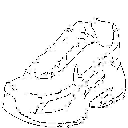

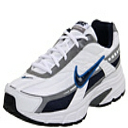

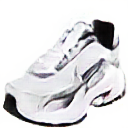

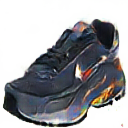

In [11]:




#display created image===================================================================================

from IPython.display import display
from PIL import Image
from imlib import dtype



    
    

def display_sample():

    # ======================================
    # =               graph                =
    # ======================================


    # placeholders & inputs
    image_ab = val_iter.get_next()
    xa = tf.placeholder(tf.float32, shape=[None, args.crop_size, args.crop_size, 3])
    b_ = tf.placeholder(tf.float32, shape=[None, n_atts])
    b_rand = tf.random.normal([args.batch_size, n_atts])



    image_a,image_b=tf.split(image_ab,2,2)
    image_a = tf.image.resize_images(image_a, [args.crop_size, args.crop_size])
    image_b = tf.image.resize_images(image_b, [args.crop_size, args.crop_size])



    # generate
    x = Gdec(Genc(xa, training=False), b_, training=False)
    _, a_ = D(xa, training=False)


    
    # ======================================
    # =            run function            =
    # ======================================
    
    def run():
        # data for sampling
        img_a, img_b = sess.run([image_a,image_b])
        a__ipt,b__ipt = sess.run([a_,b_rand], feed_dict={xa: img_b})


        x_recon = sess.run(x, feed_dict={xa: img_a, b_: a__ipt})
        x_rand = sess.run(x, feed_dict={xa: img_a, b_: b__ipt})



        img=Image.fromarray(dtype.im2uint(img_a[0]))
        display(img)
        img=Image.fromarray(dtype.im2uint(img_b[0]))
        display(img)
        img=Image.fromarray(dtype.im2uint(x_recon[0]))
        display(img)
        img=Image.fromarray(dtype.im2uint(x_rand[0]))
        display(img)



    return run



display_sample_func=display_sample()
display_sample_func()



    
    


INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.


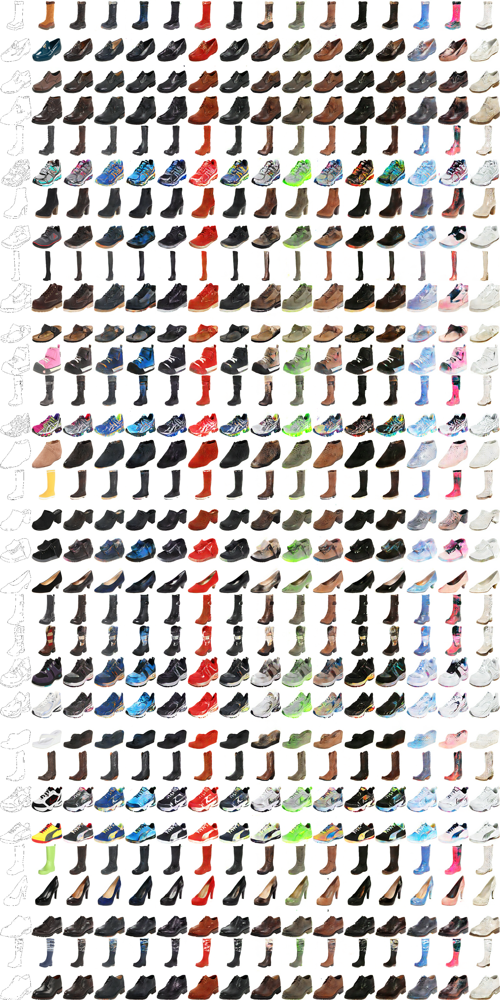

In [10]:


#display created image when zero val attribute input



def sample_graph_zeros():
    # ======================================
    # =               graph                =
    # ======================================

    # placeholders & inputs
    image_ab = val_iter.get_next()
    xa = tf.placeholder(tf.float32, shape=[None, args.crop_size, args.crop_size, 3])
    b_ = tf.placeholder(tf.float32, shape=[None, n_atts])



    
    image_a,image_b=tf.split(image_ab,2,2)
    image_a = tf.image.resize_images(image_a, [args.crop_size, args.crop_size])
    image_b = tf.image.resize_images(image_b, [args.crop_size, args.crop_size])


    
    # sample graph
    x = Gdec(Genc(xa, training=False), b_, training=False)
    _, a_ = D(xa, training=False)
    
    

    # ======================================
    # =            run function            =
    # ======================================

    save_dir = './output/%s/samples_training' % args.experiment_name
    py.mkdir(save_dir)

    def run():
        # data for sampling
        img_a, img_b = sess.run([image_a,image_b])
        a__ipt = sess.run(a_, feed_dict={xa: img_b})

        
        a__ipt=np.zeros_like(a__ipt) #set zeros

        #att create
        b_ipt_list = [a__ipt]  # the first is for reconstruction
        for i in range(n_atts):
            tmp = np.array(a__ipt, copy=True)
            tmp[:, i] = 2.0  # change attribute
            b_ipt_list.append(tmp)

        #create image
        x_opt_list = [img_a,img_b,]
        for i, b__ipt in enumerate(b_ipt_list):
            if i > 0:   # i == 0 is for reconstruction
                b__ipt[..., i - 1] = b__ipt[..., i - 1] * args.test_int
            x_opt = sess.run(x, feed_dict={xa: img_a, b_: b__ipt})
            x_opt_list.append(x_opt)
        sample = np.transpose(x_opt_list, (1, 2, 0, 3, 4))
        sample = np.reshape(sample, (-1, sample.shape[2] * sample.shape[3], sample.shape[4]))
        
        img=Image.fromarray(dtype.im2uint(sample))
        display(img)
        #im.imwrite(sample, '%s/Epoch-%d_Iter-%d.jpg' % (save_dir, epoch, iter))


    return run




sample_zeros = sample_graph_zeros()

sample_zeros()